# TC 5033
## Deep Learning
## Convolutional Neural Networks
<br>

#### Activity 2b: Building a CNN for CIFAR10 dataset with PyTorch
<br>

- Objective

    The main goal of this activity is to further your understanding of Convolutional Neural Networks (CNNs) by building one using PyTorch. You will apply this architecture to the famous CIFAR10 dataset, taking what you've learned from the guide code that replicated the Fully Connected model in PyTorch (Activity 2a).

- Instructions
    This activity requires submission in teams of 3 or 4 members. Submissions from smaller or larger teams will not be accepted unless prior approval has been granted (only due to exceptional circumstances). While teamwork is encouraged, each member is expected to contribute individually to the assignment. The final submission should feature the best arguments and solutions from each team member. Only one person per team needs to submit the completed work, but it is imperative that the names of all team members are listed in a Markdown cell at the very beginning of the notebook (either the first or second cell). Failure to include all team member names will result in the grade being awarded solely to the individual who submitted the assignment, with zero points given to other team members (no exceptions will be made to this rule).

    Understand the Guide Code: Review the guide code from Activity 2a that implemented a Fully Connected model in PyTorch. Note how PyTorch makes it easier to implement neural networks.

    Familiarize Yourself with CNNs: Take some time to understand their architecture and the rationale behind using convolutional layers.

    Prepare the Dataset: Use PyTorch's DataLoader to manage the dataset. Make sure the data is appropriately preprocessed for a CNN.

    Design the CNN Architecture: Create a new architecture that incorporates convolutional layers. Use PyTorch modules like nn.Conv2d, nn.MaxPool2d, and others to build your network.

    Training Loop and Backpropagation: Implement the training loop, leveraging PyTorch’s autograd for backpropagation. Keep track of relevant performance metrics.

    Analyze and Document: Use Markdown cells to explain your architectural decisions, performance results, and any challenges you faced. Compare this model with your previous Fully Connected model in terms of performance and efficiency.

- Evaluation Criteria

    - Understanding of CNN architecture and its application to the CIFAR10 dataset
    - Code Readability and Comments
    - Appropriateness and efficiency of the chosen CNN architecture
    - Correct implementation of Traning Loop and Accuracy Function
    - Model's performance metrics on the CIFAR10 dataset (at least 65% accuracy)
    - Quality of Markdown documentation

- Submission

Submit via Canvas your Jupyter Notebook with the CNN implemented in PyTorch. Your submission should include well-commented code and Markdown cells that provide a comprehensive view of your design decisions, performance metrics, and learnings.

In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch.utils.data import sampler
import torchvision.datasets as datasets
import torchvision.transforms as T
import matplotlib.pyplot as plt
#only if you have jupyterthemes
#from jupyterthemes import jtplot
#jtplot.style()

### Download Cifar10 dataset

In [2]:
DATA_PATH = 'Activity_2/cifar-10/cifar-10-batches-py'
NUM_TRAIN = 50000
NUM_VAL = 5000
NUM_TEST = 5000
MINIBATCH_SIZE = 64

transform_cifar = T.Compose([
                T.ToTensor(),
                T.Normalize([0.491, 0.482, 0.447], [0.247, 0.243, 0.261]) # mean and std for each channel
            ])

# Train dataset
cifar10_train = datasets.CIFAR10(DATA_PATH, train=True, download=True,
                             transform=transform_cifar)
train_loader = DataLoader(cifar10_train, batch_size=MINIBATCH_SIZE, 
                          sampler=sampler.SubsetRandomSampler(range(NUM_TRAIN)))
#Validation set
cifar10_val = datasets.CIFAR10(DATA_PATH, train=False, download=True,
                           transform=transform_cifar)
val_loader = DataLoader(cifar10_val, batch_size=MINIBATCH_SIZE, 
                        sampler=sampler.SubsetRandomSampler(range(NUM_VAL)))
#Test set
cifar10_test = datasets.CIFAR10(DATA_PATH, train=False, download=True, 
                            transform=transform_cifar)
test_loader = DataLoader(cifar10_test, batch_size=MINIBATCH_SIZE,
                        sampler=sampler.SubsetRandomSampler(range(NUM_VAL, len(cifar10_test))))

Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified


In [3]:
cifar10_train

Dataset CIFAR10
    Number of datapoints: 50000
    Root location: Activity_2/cifar-10/cifar-10-batches-py
    Split: Train
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=[0.491, 0.482, 0.447], std=[0.247, 0.243, 0.261])
           )

In [4]:
train_loader.batch_size

64

In [5]:
for i, (x, y) in enumerate(train_loader):
    print(x, y)

tensor([[[[-7.4946e-01, -4.6368e-01, -6.2245e-01,  ...,  1.2376e-01,
            3.3016e-01,  2.8499e-02],
          [-7.3359e-01, -6.0657e-01, -5.1131e-01,  ...,  6.7945e-01,
            9.6523e-01,  8.0646e-01],
          [-5.9070e-01, -5.7482e-01, -4.9544e-01,  ...,  1.6321e+00,
            1.6638e+00,  1.6321e+00],
          ...,
          [-5.1131e-01, -8.2885e-01, -7.4946e-01,  ..., -1.2258e+00,
           -1.4004e+00, -1.3528e+00],
          [-5.7482e-01, -6.3833e-01,  3.9367e-01,  ..., -1.4957e+00,
           -1.5116e+00, -1.5116e+00],
          [-7.6534e-01,  2.8253e-01,  1.5368e+00,  ..., -1.6068e+00,
           -1.6068e+00, -1.5909e+00]],

         [[-4.6962e-02, -1.4379e-01, -2.4062e-01,  ...,  2.7580e-01,
            9.8281e-02, -7.9238e-02],
          [-3.3745e-01, -2.5676e-01, -7.9238e-02,  ...,  5.6629e-01,
            7.2767e-01,  6.3084e-01],
          [-5.9566e-01, -4.3428e-01, -1.9221e-01,  ...,  1.4862e+00,
            1.5346e+00,  1.4862e+00],
          ...,
     

### Using  GPUs

In [ ]:
#if torch.cuda.is_available():
#    device = torch.device('cuda')
#else:
#    device = torch.device('cpu')
#print(device)

In [6]:
# Only for macs with Apple silicon
device = 'mps' if torch.backends.mps.is_available() else 'cpu'
print(device)

mps


### Display images

La imagen muestreada representa un: dog


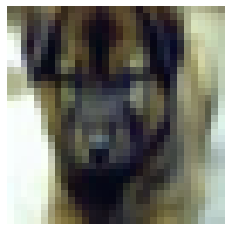

In [7]:
classes = test_loader.dataset.classes
def plot_figure(image):
    plt.imshow(np.transpose(image,(1,2,0)))
    plt.axis('off')
    plt.show()

rnd_sample_idx = np.random.randint(len(test_loader))
print(f'La imagen muestreada representa un: {classes[test_loader.dataset[rnd_sample_idx][1]]}')
image = test_loader.dataset[rnd_sample_idx][0]
image = (image - image.min()) / (image.max() -image.min() )
plot_figure(image)


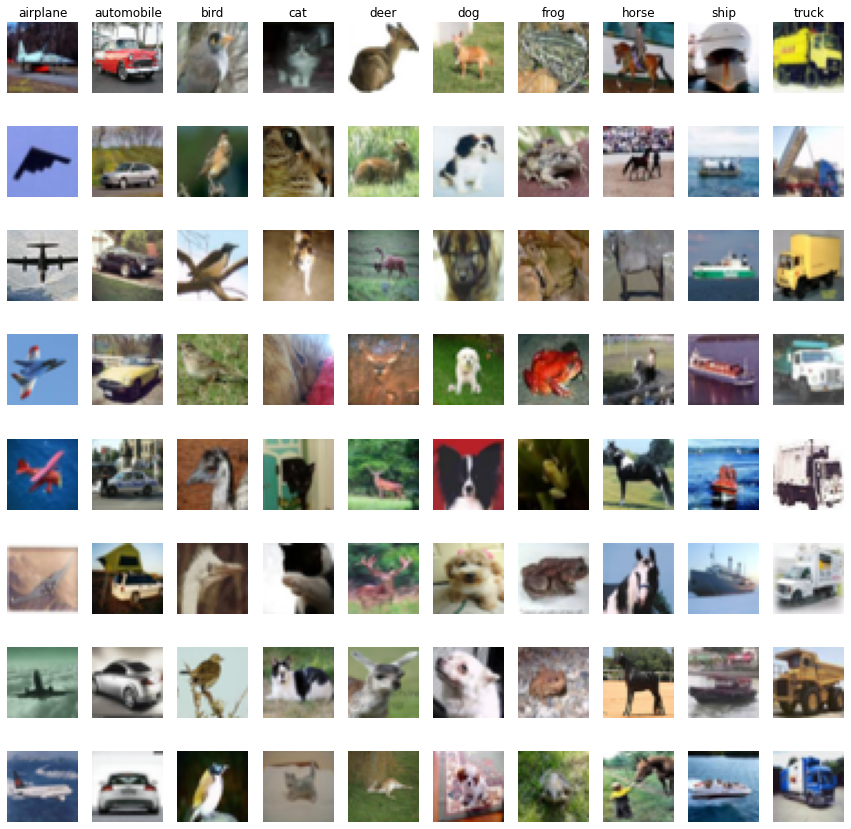

In [8]:
def plot_cifar10_grid():
    classes = test_loader.dataset.classes
    total_samples = 8
    plt.figure(figsize=(15,15))
    for label, sample in enumerate(classes):
        class_idxs = np.flatnonzero(label == np.array(test_loader.dataset.targets))
        sample_idxs = np.random.choice(class_idxs, total_samples, replace = False)
        for i, idx in enumerate(sample_idxs):
            plt_idx = i*len(classes) + label + 1
            plt.subplot(total_samples, len(classes), plt_idx)
            plt.imshow(test_loader.dataset.data[idx])
            plt.axis('off')
            
            if i == 0: plt.title(sample)
    plt.show()

plot_cifar10_grid() 

### Calculate accuracy


In [9]:
def accuracy(model, loader):
    '''
    Function to calculate accuracy of model on a given dataset
    Parameters:
        model: model to evaluate
        loader: dataset loader  
    '''
    num_correct = 0                     # initialize number of correct predictions counter
    num_total = 0                       # initialize total number of samples counter
    model.eval()                        # set model to evaluation mode
    model = model.to(device=device)     # move model to device GPU or CPU
    with torch.no_grad():               # disable gradient calculation
        for(xi, yi) in loader:
            xi = xi.to(device=device, dtype=torch.float32)          # move data to device GPU or CPU
            yi = yi.to(device=device, dtype=torch.long)             # move labels to device GPU or CPU 
            scores = model(xi)                                      # calculate scores
            _, pred = scores.max(dim=1)                             # predict class with highest score
            num_correct += (pred == yi).sum()                       # count correct predictions
            num_total += pred.size(0)                               # count total samples    
        return float(num_correct) / num_total                       # return accuracy


### Training Loop

In [10]:
def train(model, optimiser, epochs=100):
    '''
    This function trains the model
    Parameters:
        model: model to train
        optimiser: optimiser to use for training
        epochs: number of epochs to train the model
    '''
    model = model.to(device=device)     # move model to device GPU or CPU
    for epoch in range(epochs):
        for i, (xi, yi) in enumerate(train_loader):
            model.train()                                           # set model to training mode
            xi = xi.to(device=device, dtype=torch.float32)          # move data to device GPU or CPU
            yi = yi.to(device=device, dtype=torch.long)             # move labels to device GPU or CPU 
            scores = model(xi)                                      # calculate scores  

            cost = F.cross_entropy(scores, yi)                      # calculate cross-entropy loss 

            optimiser.zero_grad()                                   # reset all gradients to zero  
            cost.backward()                                         # backpropagate gradients
            optimiser.step()                                        # update parameters 

        acc = accuracy(model, val_loader)                           # calculate accuracy on validation set

        if epoch%5 == 0: 
           print(f'Epoch: {epoch}, Cost: {cost.item()}, Accuracy: {acc}')


### Linear model

The first step will be to create a linear model that will use as a baseline to compare the performance of the CNN model:

In [11]:
# To do: Use PyTorch to create a linear model to have an initial baseline model
torch.manual_seed(1)
hidden = 400
lr = 7e-4
epochs = 50
model1 = nn.Sequential(
         nn.Flatten(),
         nn.Linear(in_features=3072, out_features=hidden, bias=True),
         nn.ReLU(),
         nn.Linear(in_features=hidden, out_features=hidden, bias=True),
         nn.ReLU(),
         nn.Linear(in_features=hidden, out_features=10, bias=True)
)
optimiser = torch.optim.Adam(model1.parameters(), lr=lr)   

In [12]:
model1 

Sequential(
  (0): Flatten(start_dim=1, end_dim=-1)
  (1): Linear(in_features=3072, out_features=400, bias=True)
  (2): ReLU()
  (3): Linear(in_features=400, out_features=400, bias=True)
  (4): ReLU()
  (5): Linear(in_features=400, out_features=10, bias=True)
)

In [13]:
train(model1, optimiser, epochs)

Epoch: 0, Cost: 1.6181409358978271, Accuracy: 0.4832
Epoch: 5, Cost: 1.0137724876403809, Accuracy: 0.5298
Epoch: 10, Cost: 1.0535695552825928, Accuracy: 0.5378
Epoch: 15, Cost: 0.4320327043533325, Accuracy: 0.522
Epoch: 20, Cost: 0.2629457116127014, Accuracy: 0.5312
Epoch: 25, Cost: 0.2694087624549866, Accuracy: 0.5272
Epoch: 30, Cost: 0.29593291878700256, Accuracy: 0.5318
Epoch: 35, Cost: 0.10493291169404984, Accuracy: 0.5234
Epoch: 40, Cost: 0.20876744389533997, Accuracy: 0.5184
Epoch: 45, Cost: 0.15100526809692383, Accuracy: 0.5186


In [14]:
print(f'Linear model accuracy on test set: {accuracy(model1, test_loader)}')

Linear model accuracy on test set: 0.5142


### Sequential CNN

#### Model architecture:

1. Convolutional layer 1: filters = 32, kernel = 3x3, stride = 1, padding = 1, ReLU activation function

2. Pooling layer 1: kernel = 2x2, stride = 2

3. Convolutional layer 2: filters = 64, kernel = 3x3, stride = 1, padding = 1, ReLU activation function

4. Pooling layer 2: kernel = 2x2, stride = 2

5. Flatten layer

6. Fully connected layer 1: input = 4096 elements, neurons = 1024, ReLU activation function

7. Dropout layer 1: p = 0.5

8. Fully connected layer 2: input = 1024 elements, output neurons = 10

* Optimizer: Adam

Hyperparameters:

- batch size = 64
- learning rate = 1 e-3
- number of epochs = 30

Justification:

As a starting point, we want to implement a relatively simple CNN model with 2 convolutional layers and pooling layers that will down-sample the size of the activation map by half. After the second pooling layer we will flatten the output and feed it to a fully connected layer. At this point we will introduce a dropout layer to avoid overfitting. Finally, we will feed the output of the dropout layer to a final fully connected layer with 10 neurons, one for each class in the dataset.  
We will train the model for 30 epochs, and our aim is to achieve an accuracy greater than 70% on the test set.

In [20]:
# To do: Use PyTorch to implement a CNN model, accuracy should be better than 
#the linear model
torch.manual_seed(1)
lr = 1e-3
epochs = 30 
modelCNN1 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, stride=1, padding=1),  #Conv layer 1 output: 32x32x32
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),                                          #Pooling layer output: 16x16x32
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1), #Conv layer 2 output: 16x16x64
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),                                          #Pooling layer output: 8x8x64
            nn.Flatten(),                                                                   #Flatten layer output: 4096  
            nn.Linear(in_features=4096, out_features=1024, bias=True),                      #Fully Connected layer 1 output: 1024
            nn.ReLU(),
            nn.Dropout(p=0.5),                                                              #Dropout layer with p=0.5
            nn.Linear(in_features=1024, out_features=10, bias=True)                         #Fully Connected layer 2 output: 10      
)

optimiser = torch.optim.Adam(modelCNN1.parameters(), lr=lr) 

In [21]:
modelCNN1

Sequential(
  (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU()
  (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (4): ReLU()
  (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (6): Flatten(start_dim=1, end_dim=-1)
  (7): Linear(in_features=4096, out_features=1024, bias=True)
  (8): ReLU()
  (9): Dropout(p=0.5, inplace=False)
  (10): Linear(in_features=1024, out_features=10, bias=True)
)

In [22]:
train(modelCNN1, optimiser, epochs)

Epoch: 0, Cost: 1.4778003692626953, Accuracy: 0.6428
Epoch: 5, Cost: 1.0359935760498047, Accuracy: 0.7506
Epoch: 10, Cost: 0.13114964962005615, Accuracy: 0.7486
Epoch: 15, Cost: 0.2863469421863556, Accuracy: 0.753
Epoch: 20, Cost: 0.0383424311876297, Accuracy: 0.7516
Epoch: 25, Cost: 0.012482564896345139, Accuracy: 0.7448


In [23]:
print(f'CNN model accuracy on test set: {accuracy(modelCNN1, test_loader)}')

CNN model accuracy on test set: 0.7488
